In [ ]:
#importing necessary libraries
from skimage import io
import cv2
from skimage.filters import gaussian,gabor, gabor_kernel
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np
import glob
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


1) Access the images and show them, just to check if you are working with the correct set of images. 


In [ ]:
imgcount=20
arrimg=[]
#initialization for convolution of 0, 45, 90, 135 and no edge degree filter on original images
arrfil0 = np.array([[-1, 2, -1], [-2, 4, -2], [-1, 2, -1]])
arrfil45 = np.array([[-2, -1, 2], [-1, 4, -1], [2, -1, -2]])
arrfil90 = np.array([[-1, -2, -1], [2, 4, 2], [-1, -2, -1]])
arrfil135 = np.array([[2, -1, -2], [-1, 4, -1], [-2, -1, 2]])
arrfilno = np.array([[-1, -1, -1],  [-1 ,8, -1], [-1, -1,-1]])

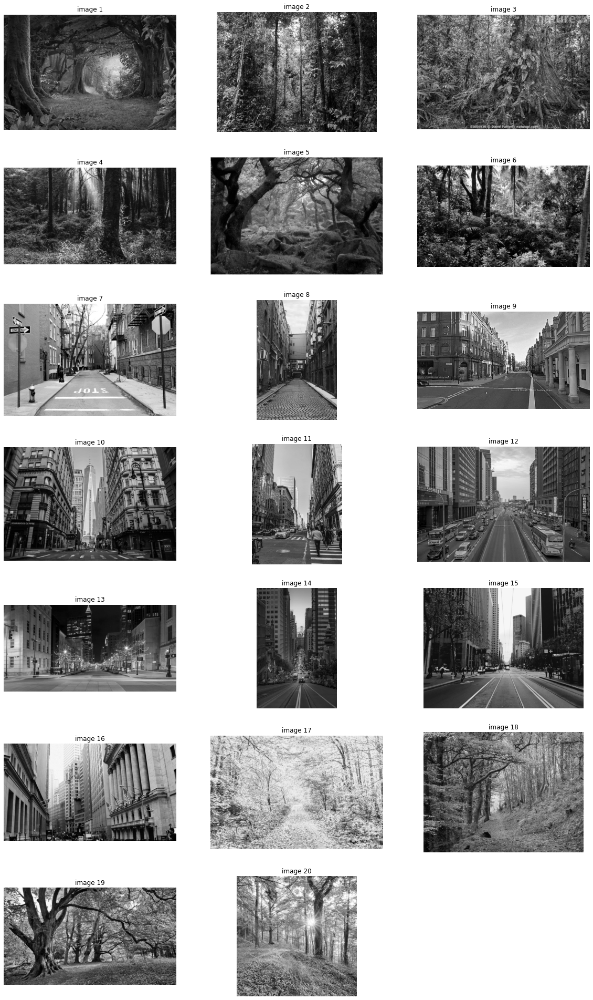

In [ ]:
#Displaying all the images
i,j=0,1
plt.figure(figsize=(20, 100))
for image in glob.glob('/content/drive/MyDrive/City-Forest/*.jpg'):
  arrimg.append(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2GRAY).astype(float))
  plt.subplot(20,3,j) #plotting the image
  plt.imshow(arrimg[i], cmap='gray')
  plt.axis('off')
  plt.title('image '+str(i+1))
  i,j=i+1,j+1
plt.show()


2) For each image
a) Create DoG and extract edges.
 You can borrow your own code from programming assignment 1 with appropriate corrections (if needed). 
Use an appropriate pair of sigmas and window sizes learned from programming assignment 1 for the DoG filter. Experimentation with multiple DoG filters is not needed.


In [ ]:
#dof_filter from Assignment 1
def dof_filter(img, low_sigma, high_sigma):
  mode='nearest' 
  cval=0
  truncate=4.0
  img = img.astype(float)
  low_sigma = (np.array(low_sigma, dtype='float', ndmin=1))* np.ones(img.ndim)
  high_sigma = (np.array(high_sigma, dtype='float', ndmin=1))* np.ones(img.ndim) 
  i1 = gaussian(img, low_sigma, mode=mode, cval=cval, truncate=truncate, preserve_range=False)
  i2 = gaussian(img, high_sigma, mode=mode, cval=cval, truncate=truncate, preserve_range=False)
  return i1-i2

<function matplotlib.pyplot.show>

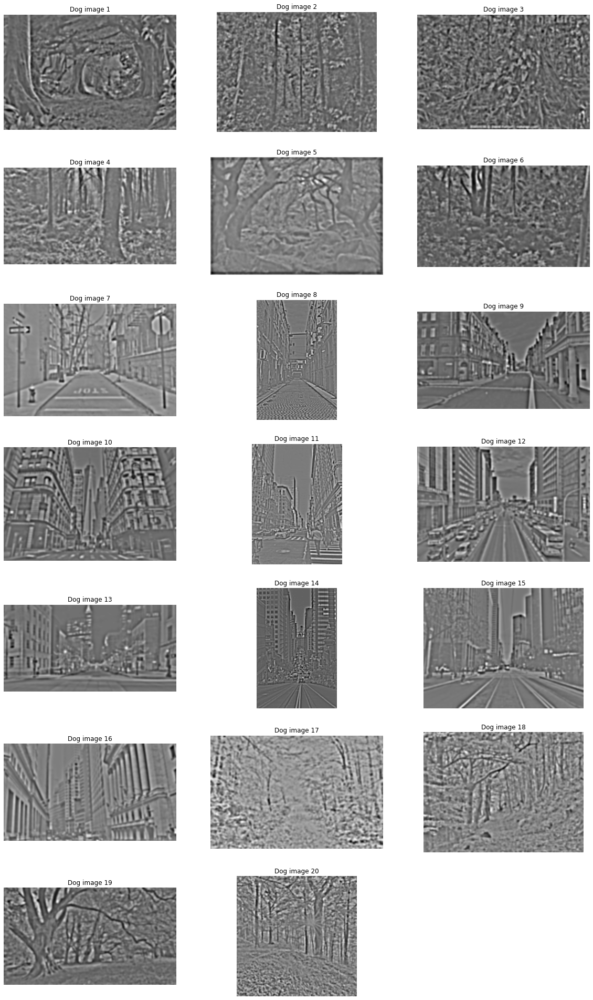

In [ ]:
#applying dog filter with low sigma 3 and high sigma 7
arrdog=[]
for x in range(20):
  arrdog.append(dof_filter(arrimg[x],3,7))

plt.figure(figsize=(20, 100))
for x in range(20):
  plt.subplot(20,3,x+1) #plotting the image
  plt.imshow(arrdog[x], cmap='gray')
  plt.axis('off')
  plt.title('Dog image '+str(x+1))
plt.show


In [ ]:
#convolution of the edge images of 0,45,90,135 and no edge with the original image
arrlist0,arrlist45,arrlist90, arrlist135,arrlistno,arrHist=[],[],[],[],[],[]
for x in range(20):
  arrlist0.append(cv2.filter2D(arrdog[x],-1, arrfil0)) 
  arrlist45.append(cv2.filter2D(arrdog[x],-1, arrfil45)) 
  arrlist90.append(cv2.filter2D(arrdog[x],-1, arrfil90)) 
  arrlist135.append(cv2.filter2D(arrdog[x],-1, arrfil135)) 
  arrlistno.append(cv2.filter2D(arrdog[x],-1, arrfilno)) 

2 b. Compute the global edge histogram (we treat it as a simplified spatial envelop representation)
-> Keep an entry for “no edge”, i.e. for the image locations where you find no edge.
-> Normalize with respect to image size
->Each image will be represented by a histogram with five numbers, adding upto 1


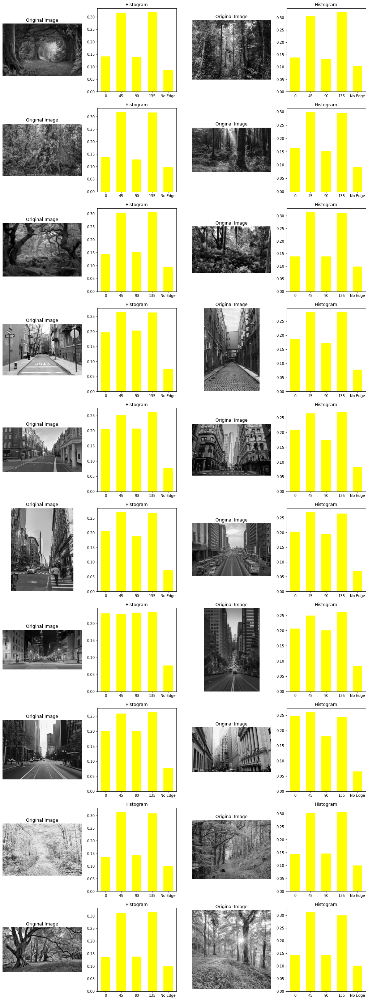

In [ ]:
j=1
plt.figure(figsize=(18, 50))
for i in range(20):
  row,col = arrlist0[i].shape
  count0, count45, count90, count135, countno = 0, 0, 0, 0, 0
  #extracting the higher pixel values from all the edge images and increamenting the count
  for r in range(row):
    for c in range(col):
      if arrlist0[i][r][c] > arrlist45[i][r][c] and arrlist0[i][r][c] > arrlist90[i][r][c] and arrlist0[i][r][c] > arrlist135[i][r][c] and arrlist0[i][r][c] > arrlistno[i][r][c]:
        count0 =count0+1
      elif arrlist45[i][r][c] > arrlist90[i][r][c] and arrlist45[i][r][c] > arrlist135[i][r][c] and arrlist45[i][r][c] > arrlistno[i][r][c]:
        count45 =count45+1
      elif arrlist90[i][r][c] > arrlist135[i][r][c] and arrlist90[i][r][c] > arrlistno[i][r][c]:
        count90 =count90+1
      elif arrlist135[i][r][c] > arrlistno[i][r][c]:
        count135 =count135+1
      else:
        countno+=1

  his=[]
  #normalizing the count values for histogram
  his.append(count0/(arrimg[i].shape[0] * arrimg[i].shape[1]))
  his.append(count45/(arrimg[i].shape[0] * arrimg[i].shape[1]))
  his.append(count90/(arrimg[i].shape[0] * arrimg[i].shape[1]))
  his.append(count135/(arrimg[i].shape[0] * arrimg[i].shape[1]))
  his.append(countno/(arrimg[i].shape[0] * arrimg[i].shape[1]))
  arrHist.append(his)
  histogram = {'0':arrHist[i][0], '45':arrHist[i][1], '90': arrHist[i][2], '135' :arrHist[i][3], 'No Edge': arrHist[i][4]}
#plotting the histogram
  plt.subplot(10,4,j)
  plt.imshow(arrimg[i],cmap='gray')
  plt.axis('off')
  plt.title('Original Image')
  j=j+1
  
  plt.subplot(10,4,j)
  plt.bar(histogram.keys(),histogram.values(), color ='yellow',width = 0.6)
  plt.title('Histogram')
  j=j+1
plt.show()

3)Observe the four oriented edge orientation maps and the corresponding histograms for a few forest and city images, and comment on the differences observed.


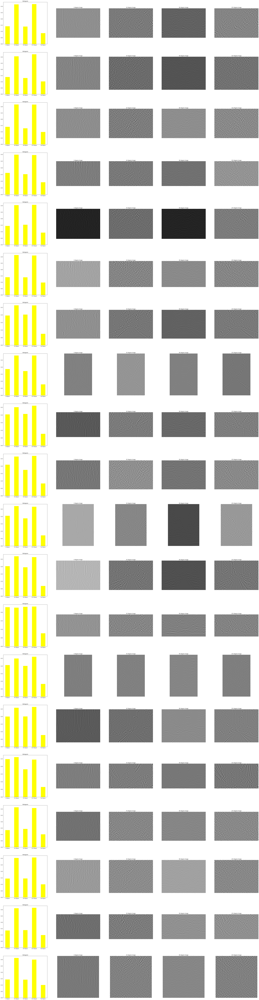

In [ ]:

j=1
plt.figure(figsize=(50, 200))
for i in range(20):
   #plotting edge normalized histogram
  histogram = {'0 Degree':arrHist[i][0], '45 Degree':arrHist[i][1], '90 Degree': arrHist[i][2], '135 Degree' :arrHist[i][3], 'No Degree': arrHist[i][4]}
  plt.subplot(20,5,j)
  plt.bar(histogram.keys(),histogram.values(), color ='yellow',width = 0.5)
  plt.title('Histogram')
  j+=1
  #display 0 degree image
  plt.subplot(20,5,j)
  plt.imshow(arrlist0[i],cmap='gray')
  plt.axis('off')
  plt.title('0 degree Image')
  j+=1
  #display 45 degree image
  plt.subplot(20,5,j)
  plt.imshow(arrlist45[i],cmap='gray')
  plt.axis('off')
  plt.title('45 degree Image')
  j+=1
  #display 90 degree image
  plt.subplot(20,5,j)
  plt.imshow(arrlist90[i],cmap='gray')
  plt.axis('off')
  plt.title('90 degree Image')
  j+=1
  #display 135 degree image
  plt.subplot(20,5,j)
  plt.imshow(arrlist135[i],cmap='gray')
  plt.axis('off')
  plt.title('135 degree Image')
  j+=1
 

plt.show()


4) Apply k-means clustering algorithm (k=2) on the histograms, and show the images in each cluster separately. Comment on the clustering performance.


In [ ]:
#k-means model
n_clusters=2
#flatting all the images to list
Flat_histogram = [item for sub in arrHist for item in sub] 
#applying K-means 
kmeans = KMeans(n_clusters) 
#fitting the histogram 
kmeans.fit(np.array(Flat_histogram).reshape(-1,1)) 


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

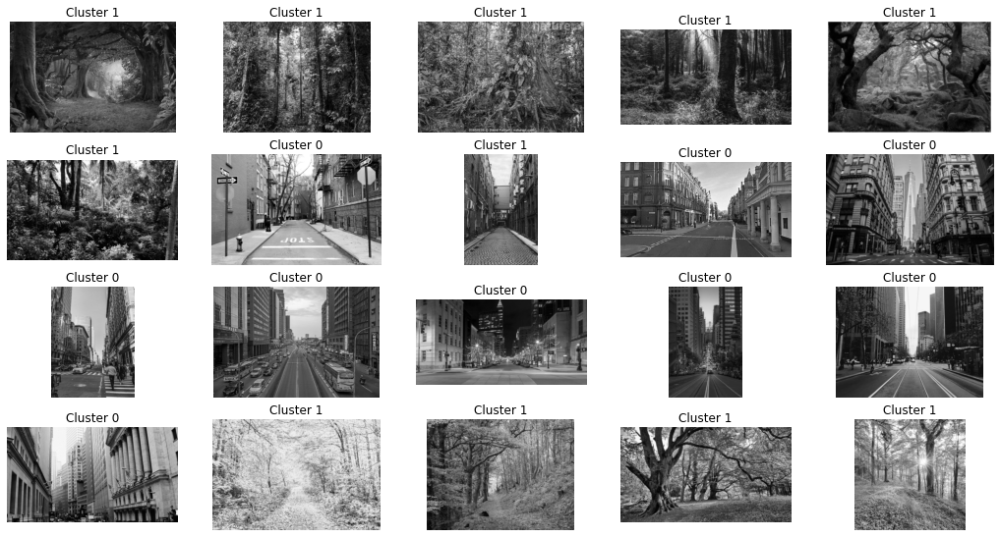

In [ ]:
x=0
plt.figure(figsize=(18, 12))
for i in range (0,100,5):
  sum=0
  #allocating the maximum edge belongign to the cluster

  for j in range(5):
    sum+=kmeans.labels_[i+j]
  
  plt.subplot(5,5,x+1)
  plt.imshow(arrimg[x], cmap='gray')
  x=x+1
  plt.axis('off')
  if sum<=2:
    plt.title('Cluster 0')
  else:
    plt.title('Cluster 1')

plt.show()